# DreamBooth Personalization with Diffusers & LoRA

## Setup

In [1]:
import os
from google.colab import userdata

In [2]:
!pip install -q diffusers accelerate "huggingface_hub[cli]" wandb

In [3]:
%%bash
git clone https://github.com/huggingface/peft
cd peft/examples/lora_dreambooth
pip install -r requirements.txt -q
pip install git+https://github.com/huggingface/peft -q

fatal: destination path 'peft' already exists and is not an empty directory.


In [4]:
!pip install -r /content/peft/examples/lora_dreambooth/requirements.txt -q

In [5]:
os.environ['HUGGINGFACE'] = userdata.get("HUGGINGFACE")
os.environ['WANDB_API_KEY'] = userdata.get("WANDB_API_KEY")

In [6]:
!git config --global credential.helper store

In [7]:
!huggingface-cli login --token $HUGGINGFACE --add-to-git-credential

Token is valid (permission: write).
The token `colab` has been saved to /root/.cache/huggingface/stored_tokens
Your token has been saved in your configured git credential helpers (store).
Your token has been saved to /root/.cache/huggingface/token
Login successful.
The current active token is: `colab`


In [8]:
!wandb login

wandb: WARNING Using legacy-service, which is deprecated. If this is unintentional, you can fix it by ensuring you do not call `wandb.require('legacy-service')` and do not set the WANDB_X_REQUIRE_LEGACY_SERVICE environment variable.
wandb: Currently logged in as: grinvolod13 (grinvolod13-kau-edu-ua) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


In [9]:
!accelerate config default

Configuration already exists at /root/.cache/huggingface/accelerate/default_config.yaml, will not override. Run `accelerate config` manually or pass a different `save_location`.


In [10]:
%env MODEL_NAME=stable-diffusion-v1-5/stable-diffusion-v1-5
%env OUTPUT_DIR=/content/lora-personal
%env HUB_MODEL_ID=lora-personal
%env INSTANCE_DIR=/content/drive/MyDrive/lora-dataset

env: MODEL_NAME=stable-diffusion-v1-5/stable-diffusion-v1-5
env: OUTPUT_DIR=/content/lora-personal
env: HUB_MODEL_ID=lora-personal
env: INSTANCE_DIR=/content/drive/MyDrive/lora-dataset


## Training

In [11]:
!accelerate launch /content/peft/examples/lora_dreambooth/train_dreambooth.py \
 --pretrained_model_name_or_path=$MODEL_NAME  \
  --instance_data_dir=$INSTANCE_DIR \
  --output_dir=$OUTPUT_DIR \
  --num_dataloader_workers=1 \
  --train_text_encoder \
  --instance_prompt="a photo of volodymyr_sks person" \
  --resolution=512 \
  --train_batch_size=2 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --use_lora \
  --lora_r 8 \
  --lora_alpha 27 \
  --lora_text_encoder_r 8 \
  --lora_text_encoder_alpha 17 \
  --learning_rate=1e-4 \
  --gradient_accumulation_steps=1 \
  --gradient_checkpointing \
  --max_train_steps=1500 \
  --hub_model_id=$HUB_MODEL_ID \
  --report_to wandb

2025-06-06 10:42:26.354189: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-06-06 10:42:26.369972: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1749206546.390994    6274 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1749206546.397393    6274 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-06-06 10:42:26.418213: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

## Pipeline

In [11]:
from diffusers import StableDiffusionPipeline
from peft import LoraConfig, PeftModel
import torch
def get_lora_sd_pipeline(
    ckpt_dir, base_model_name_or_path=None, dtype=torch.float16, device="cuda", adapter_name="default"
):
    unet_sub_dir = os.path.join(ckpt_dir, "unet")
    text_encoder_sub_dir = os.path.join(ckpt_dir, "text_encoder")
    if os.path.exists(text_encoder_sub_dir) and base_model_name_or_path is None:
        config = LoraConfig.from_pretrained(text_encoder_sub_dir)
        base_model_name_or_path = config.base_model_name_or_path

    if base_model_name_or_path is None:
        raise ValueError("Please specify the base model name or path")

    pipe = StableDiffusionPipeline.from_pretrained(base_model_name_or_path, torch_dtype=dtype).to(device)
    pipe.unet = PeftModel.from_pretrained(pipe.unet, unet_sub_dir, adapter_name=adapter_name)

    if os.path.exists(text_encoder_sub_dir):
        pipe.text_encoder = PeftModel.from_pretrained(
            pipe.text_encoder, text_encoder_sub_dir, adapter_name=adapter_name
        )

    if dtype in (torch.float16, torch.bfloat16):
        pipe.unet.half()
        pipe.text_encoder.half()

    pipe.to(device)
    return pipe

## Inference

In [12]:
prompts = [
    "a photo of volodymyr_sks sits in chair in black suit",
    "a photo of volodymyr_sks, smile, park, green trees, blue skye",
    "a photo of volodymyr_sks, sad, ocean, blue ocean",
    "an image of volodymyr_sks in anime style, fighting demons, samurai sword",
    "photo of volodymyr_sks in american psycho style patrick bateman headphones",
    "photo of volodymyr_sks with family, many people, group",
    "photo of volodymyr_sks flying in sky ultrarealistic",
    "photo of volodymyr_sks as president of Ukraine, a lot of Ukraininan flags, leader",
    "picture of volodymyr_sks in arcane game LOL style, shades, jinx",
    "picture of volodymyr_sks in scary vampire stype, gothic, dark image, scary, long faangs, vampire",
]

In [13]:
pipe = get_lora_sd_pipeline("/content/lora-personal", adapter_name="Volodymyr", dtype=torch.float32)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [14]:
negative_prompt = "owres, text, error, cropped, worst quality, low quality, jpeg artifacts, ugly, duplicate, morbid, mutilated, out of frame, extra fingers, mutated hands, poorly drawn hands, poorly drawn face, mutation, deformed, blurry, dehydrated, bad anatomy, bad proportions, extra limbs, cloned face, disfigured, gross proportions, malformed limbs, missing arms, missing legs, extra arms, extra legs, fused fingers, too many fingers, long neck, username, watermark, signature "
images = pipe(prompts,num_images_per_prompt=4, num_inference_steps=100, guidance_scale=5, negative_prompt=[negative_prompt]*len(prompts)).images

  0%|          | 0/100 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


In [15]:
len(images)

40

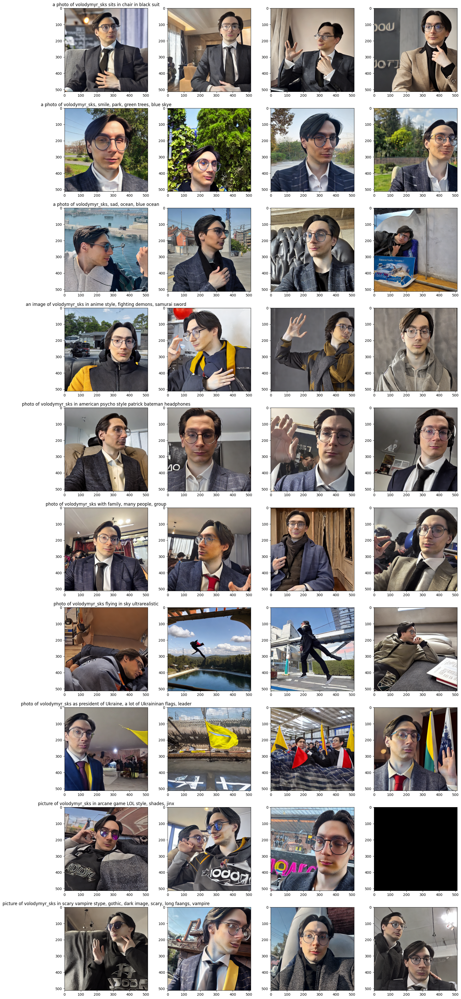

In [16]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(4*5,5*len(prompts)))
axs = fig.axes
gs = fig.add_gridspec(ncols=4, nrows=len(prompts), )
axs = gs.subplots()
for i, img in enumerate(images):
  axs[  i//4, (i%4)%len(prompts)].imshow(img)
  if (i%4)%len(prompts)==0:
    axs[  i//4, (i%4)%len(prompts)].set_title(prompts[i//4], size='large')
plt.subplots_adjust(wspace=0.2, hspace=0.2)